<a href="https://colab.research.google.com/github/Tecnologias-Emergentes-Equipo4/Proyecto1/blob/main/Proyecto1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto 1: Predicción de Enfermedades Cardiovasculares

## 1. Exploración de Datos

Se importan las librerías a utilizarse y se monta el drive donde se encuentra el csv.

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


A continuación, se crea y explora superficialmente la distribución de los datos del dataframe.

In [ ]:
df = pd.read_csv("/content/drive/Shareddrives/Tecnologías Emergentes/Proyecto 1/cardio_train.csv", sep=";")
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1


In [ ]:
display(df.info(), df.describe().T)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


None

,count,mean,std,min,25%,50%,75%,max
id,70000.0,49972.419900,28851.302323,0.0,25006.75,50001.5,74889.25,99999.0
age,70000.0,19468.865814,2467.251667,10798.0,17664.00,19703.0,21327.00,23713.0
gender,70000.0,1.349571,0.476838,1.0,1.00,1.0,2.00,2.0
height,70000.0,164.359229,8.210126,55.0,159.00,165.0,170.00,250.0
weight,70000.0,74.205690,14.395757,10.0,65.00,72.0,82.00,200.0
ap_hi,70000.0,128.817286,154.011419,-150.0,120.00,120.0,140.00,16020.0
ap_lo,70000.0,96.630414,188.472530,-70.0,80.00,80.0,90.00,11000.0
cholesterol,70000.0,1.366871,0.680250,1.0,1.00,1.0,2.00,3.0
gluc,70000.0,1.226457,0.572270,1.0,1.00,1.0,1.00,3.0
smoke,70000.0,0.088129,0.283484,0.0,0.00,0.0,0.00,1.0


In [ ]:
def dist_output(df):
  fig = go.Figure(data=(go.Bar(y = df['cardio'].value_counts(),
                              x = ['Saludables', 'Convalecientes'],
                              text = df['cardio'].value_counts(),
                              textfont = dict(size=15),
                              textposition='auto',
                              opacity = 0.7,
                              marker = dict(
                                  color = ['indianred', 'royalblue'],
                                  line=dict(color='black', width = 2.0))
                              )))
  fig.update_layout(
      title_text = "Presencia de Enfermedades Cardiacas", title_font_size=30, title_x = 0.5
  )

  fig.update_xaxes(
      title = 'Condición'
  )

  fig.update_yaxes(
    title = 'Numero de pacientes'    
  )

  fig.show(renderer='colab')

In [ ]:
dist_output(df)

La distribución de personas, en cuanto a la variable objetivo se refiere, es bastante equitativa. El porcetaje de diferencia entre la cantidad de pacientes saludables y aquellos que cuentan con alguna enfermedad cardiaca es del 0.12%.

In [ ]:
X = df.drop(['id', 'cardio'], axis=1)
y = df['cardio']
display(X.head(), y.head())

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active
0,18393,2,168,62.0,110,80,1,1,0,0,1
1,20228,1,156,85.0,140,90,3,1,0,0,1
2,18857,1,165,64.0,130,70,3,1,0,0,0
3,17623,2,169,82.0,150,100,1,1,0,0,1
4,17474,1,156,56.0,100,60,1,1,0,0,0


0    0
1    1
2    1
3    1
4    0
Name: cardio, dtype: int64

In [ ]:
r, c = 4, 3

fig = make_subplots(rows=r, cols=c)
traces = []

for col in X.columns:
  traces.append(go.Histogram(x=X[col].values,
                             name = X[col].name))
  
for i in range(r):
  for j in range(c):
    try:
      fig.append_trace(traces[i*c+j], i+1, j+1)
    except BaseException as e:
      print(e)
      break

fig.show(renderer='colab')

list index out of range


In [ ]:
fig = go.Figure()
for (column_name, column_data) in X.iteritems():
  fig.add_trace(go.Box(y=column_data.values, name = column_name))
fig.show(renderer="colab")

Se observa de manera gráfica la distribución de las variables independientes del dataframe.

In [ ]:
def dist_per_feature(feat):
  healthy = df[df['cardio'] == 0][feat]
  convalecientes = df[df['cardio'] == 1][feat]

  histogram = [healthy, convalecientes]
  fig = ff.create_distplot(histogram, group_labels=['Sin Enfermedad Cardiaca', 'Con Enfermedad Cardiaca'],
                           colors = ['indianred', 'royalblue'])
  
  fig.update_layout(
      title_text = feat + " distribution", title_font_size = 30, title_x = 0.5
  )
  fig.show(renderer='colab')

In [ ]:
dist_per_feature('age')

Se puede apreciar en la gráfica de arriba como, a partir de lo que aproximadamente son los 55 años de edad, la distribución de pacientes cambia, incrementando más la cantidad de pacientes que sufren de alguna enfermedad cardiaca entre más avanza la edad.

Este factor se utiliza para definir una nueva variable independiente para el dataset.

In [ ]:
df.loc[:, 'above_55'] = 0
df.loc[(df['age'] > 20075), 'above_55'] = 1
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,above_55
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,0
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,0
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,0


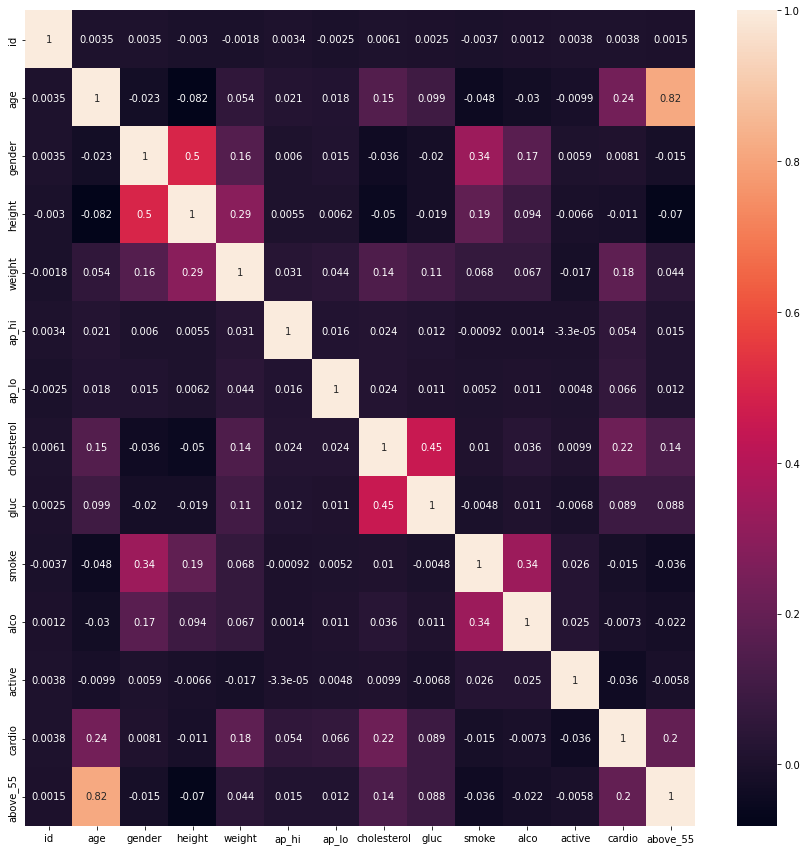

In [ ]:
plt.figure(figsize=(15, 15))
sns.heatmap(df.corr(), annot=True)
plt.show()

El mapa de calor muestra de manera gráfica el nivel de correlación que comparten las variables entre sí. Los siguientes procedimientos se enfocan en explorar las correlaciones más significativas.

In [ ]:
def plot_feat1_feat2(feat1, feat2):
  fig = go.Figure()
  C = df[(df['cardio'] == 1)]
  H = df[(df['cardio'] == 0)]

  traceC = go.Scatter(
      x = C[feat1],
      y = C[feat2],
      name = 'Convaleciente',
      mode= 'markers',
      marker = dict(color = 'red',
                    line = dict(width = 2)))
  
  traceH = go.Scatter(
      x = H[feat1],
      y = H[feat2],
      name = 'Saludable',
      mode = 'markers',
      marker = dict(color = 'blue',
                    line = dict(width =2))
  )

  fig.add_trace(traceH)
  fig.add_trace(traceC)
  fig.update_layout(
      title_text = feat1 + " vs " + feat2, title_font_size=30, title_x = 0.5
  )
    
  fig.update_xaxes(
      title = feat1
  )

  fig.update_yaxes(
    title = feat2    
  )    

  fig.show(renderer="colab")

In [ ]:
plot_feat1_feat2('height', 'weight')

La estatura y el peso de los pacientes tienen una correlación significativa que tiene un impacto en la predisposición a una enfermedad cardiaca. Investigando acerca de esta relación se descubrió que ambos valores se utilizan para calcular el **Índice de Masa Corporal (BMI)**, el cual es una medida que sirve para determinar si un individuo cuenta con sobrepeso u obesidad, factor que contribuye al desarrollo de enfermedades cardiovasculares.

Para la inclusión del BMI como variable independiente, se optó por utilizar la formula de [New BMI](https://people.maths.ox.ac.uk/trefethen/bmi.html), propuesta por Nick Trefethen, Profesor de Análisis Numérico para la Universidad de Oxford.

La formula del New BMI es la siguiente: 
\begin{align}
        \frac{1.3 \cdot Peso(kg) \,} {Estatura(m)^(2.5)}
    \end{align}


In [ ]:
df.loc[:, 'New_BMI'] = 1.3 * (df.loc[:, 'weight'] / ((df.loc[:, 'height'] / 100) ** 2.5))
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,above_55,New_BMI
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,0,22.032402
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,1,36.353881
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,0,23.791042
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,0,28.710479
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,0,23.950792


Como último paso, se remueve la variable de edad debido a su alta correlación con la variable de "above_55" para evitar redundancia y reducir la complejidad del algoritmo. 

Finalmente, se divide el dataframe en *features* y *output*, lo cual facilitará su uso para algoritmos de ML.

In [ ]:
X = df.drop(['id', 'cardio', 'age'], axis=1)
y = df['cardio'] ## target
display(X.head())

,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,above_55,New_BMI
0,2,168,62.0,110,80,1,1,0,0,1,0,22.032402
1,1,156,85.0,140,90,3,1,0,0,1,1,36.353881
2,1,165,64.0,130,70,3,1,0,0,0,0,23.791042
3,2,169,82.0,150,100,1,1,0,0,1,0,28.710479
4,1,156,56.0,100,60,1,1,0,0,0,0,23.950792


## 2.Modelos

### CatBoost

Ejecutar esta celda para iniciar la instalación de catboost

In [ ]:
!pip install catboost

     |████████████████████████████████| 76.4 MB 42 kB/s 


Importamos Catboost al entorno

In [ ]:
import catboost
print(catboost.__version__)

1.0.0


### XGBOOST

Ejecutar esta celda para realizar la instalación de XGBoost:

In [ ]:
!pip install xgboost

In [ ]:
import xgboost as xgb 
from sklearn.model_selection import train_test_split

# Se divide la información en 80% para entrenamiento y 20% para test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)



In [ ]:
# Se convierte nuestra data en una DMatrix, uno para los datos de entrenamiento y otro para los datos de test.
train = xgb.DMatrix(X_train,label=y_train)
test = xgb.DMatrix(X_test,label=y_test)




**Definición de hiperparámetros**
1. max_depth : Profundidad del arbol
2. eta : (learning rate)
3. Objetive Multi softmax : Es la función de costo para clasificación
4. Numero de clases --> Número de categorías de nuestro atributo objetivo

**Función de costo**

Utilizamos como objetivo "multi softmax" debido a que es utilizada para problemas de clasificación.

https://xgboost.readthedocs.io/en/latest/parameter.html#learning-task-parameters

**Cómo ajustamos los parámetros**

Estuvimos experimentando con los parámetros de max_depth y eta. Dentro de nuesta investigación dimos con que el valor por default de **max_depth** es 6, sin embargo si el valor es muy alto se puede generar un árbol muy complejo que te llevará al overfitting y un consumo muy grande de memoria. Intentamos también números menores a 6 sin embargo nuestro accuracy disminuía.

Para el **learning rate** investigamos que si el eta es más grande hace que el cálculo sea más rápido (porque necesita introducir menos rondas) pero no hace que se alcance el mejor óptimo. Por otro lado, al disminuir el valor de eta hace que el cálculo sea más lento (porque hay que introducir más rondas) pero facilita alcanzar el mejor óptimo. Estuvimos experimentando con valores como 0.1, 0.001, 0.02, 0.3, 0.03 y nos percatamos que el que mejor accuracy nos daba era el 0.3

https://towardsdatascience.com/20-burning-xgboost-faqs-answered-to-use-the-library-like-a-pro-f8013b8df3e4

https://medium.com/data-design/let-me-learn-the-learning-rate-eta-in-xgboost-d9ad6ec78363

In [ ]:

parameters = {
    'max_depth':6,
    'eta':0.03,
    'objective':'multi:softmax',
    'num_class':2, ## numero de clases
}

epochs = 15 ## número de iteraciones

In [ ]:
#se crea el modelo de xgb colocando los hiperparámetros, la DMatrix (del training data) y el número de iteraciones
model = xgb.train(parameters,train,epochs)
predictions = model.predict(test)

In [ ]:
print(predictions)

In [ ]:
from sklearn.metrics import accuracy_score
print( "Accuracy:", accuracy_score(y_test,predictions)*100,'%')

Accuracy: 73.02142857142857 %


Para tratar de mejorar la eficacia del modelo con XGBoost se decide utilizar *one-hot encoding* en las variables categóricas de 'gluc', 'cholesterol' y 'gender'.

Para evitar crear redundancia, y debido a que 'gender' solo cuenta con 2 categorías, se remueve la columna de hombres, reduciendo la complejidad del modelo.

In [ ]:
gluc_dummies = pd.get_dummies(df['gluc'], prefix='gluc')
chol_dummies = pd.get_dummies(df['cholesterol'], prefix='chol')
gender_dummies = pd.get_dummies(df['gender']).iloc[: , :1].rename(columns={1:'women'})
gender_dummies.head()

,women
0,0
1,1
2,1
3,0
4,1


El dataframe resultante de la conversión con *one-hot encoding* es el siguiente:

In [ ]:
X2 = pd.concat([X, gluc_dummies, chol_dummies, gender_dummies], axis=1).drop(['gluc', 'cholesterol', 'gender'], axis=1)
X2.head()

,height,weight,ap_hi,ap_lo,smoke,alco,active,above_55,New_BMI,gluc_1,gluc_2,gluc_3,chol_1,chol_2,chol_3,women
0,168,62.0,110,80,0,0,1,0,22.032402,1,0,0,1,0,0,0
1,156,85.0,140,90,0,0,1,1,36.353881,1,0,0,0,0,1,1
2,165,64.0,130,70,0,0,0,0,23.791042,1,0,0,0,0,1,1
3,169,82.0,150,100,0,0,1,0,28.710479,1,0,0,1,0,0,0
4,156,56.0,100,60,0,0,0,0,23.950792,1,0,0,1,0,0,1
